In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import ast
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import chi2_contingency


pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# Read in the data
issues = pd.read_csv('data/coded_issue_data.csv', sep=';')
participants = pd.read_csv('data/participants.csv')

# clean up data
issues = issues.drop(columns=['url','title','type','html_url','privacy_issue_rater_1', 'consent_interaction_rater_1', 'resolution_rater_1', 'last_edit_rater_1', 'trigger_rater_1', 'reason_rater_1', 'Unnamed: 35'])
issues = issues.rename(columns={'privacy_issue_rater_2':'privacy_issue', 'consent_interaction_rater_2':'consent_interaction', 'resolution_rater_2':'resolution', 'last_edit_rater_2':'last_edit', 'trigger_rater_2':'trigger', 'reason_rater_2':'reason', 'reason_rater_2_category':'reason_category'})

# convert columns
issues['created_at'] = pd.to_datetime(issues['created_at'])
issues['is_privacy_related'] = issues['is_privacy_related'].apply(lambda x: True if x == 'true' else False)

/tmp/ipykernel_667/2743463832.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


# Compute demographic data

In [2]:
all_issues = pd.read_csv('data/all_issues.csv')
all_projects = all_issues['project'].unique()
print('Number of projects with at least one issue matching our keywords: ', len(all_projects))
print('Number of issues matching our keywords: ', len(all_issues))

Number of projects with at least one issue matching our keywords:  5069
Number of issues matching our keywords:  12660


# False positive rate of the keyword search

In [3]:
issues['keywords'] = issues['keywords'].apply(lambda x: ast.literal_eval(ast.literal_eval(x)))
all_keywords = sorted(set([kw for kws in issues.keywords for kw in kws]))
keyword_data_map = {}
for keyword in all_keywords:
    keyword_mask = issues['keywords'].apply(lambda x: keyword in x)
    count_keyword = sum(keyword_mask)
    count_keyword_fp = sum(keyword_mask & (~issues['is_privacy_related']))
    fpr_keyword = count_keyword_fp / count_keyword
    keyword_data_map[keyword] = (count_keyword, count_keyword_fp, fpr_keyword)
keyword_fp_df = pd.DataFrame.from_dict(keyword_data_map, orient='index', columns=['count', 'count_fp', 'fpr']).sort_values('fpr', ascending=False)
keyword_fp_df

,count,count_fp,fpr
tracking,16,16,1.000000
data sharing,71,66,0.929577
fingerprinting,105,93,0.885714
data protection,41,34,0.829268
cookie prompt,79,64,0.810127
privacy controls,68,53,0.779412
privacy policy,4,3,0.750000
cookie notice,100,75,0.750000
personally identifiable information,203,146,0.719212
privacy act,67,46,0.686567


In [4]:
keyword_fp_df.to_latex('keyword_fp_df.tex')

In [5]:
print('Overall false positive rate:')
sum(~issues['is_privacy_related'])/len(issues)

Overall false positive rate:


0.629755820556502

# Analyze variables

## Filter issues

In [6]:
# from here on, we only consider issues that are privacy-related
issues = issues[issues['is_privacy_related']]

privacy_issue_map = {
    'fr for privacy enhancement': 'Feature request for privacy enhancement',
    'fr with implication for privacy': 'Feature request with implication for privacy',
    'fr for regulation compliance': 'Feature request for regulation compliance',
    'fr for privacy documentation': 'Feature request for privacy documentation',
    'existing feature with implication for privacy': 'Existing feature with implication for privacy',
    'bug with implication for privacy': 'Bug with implication for privacy',
    'fr for consent interaction': 'Feature request for consent interaction',
    'other': 'Other privacy-related issues',
    'bug with implication for consent interaction': 'Bug with implication for consent interaction',
    'compliance evaluation': 'Compliance evaluation',
    'cookie banner missing': 'Cookie banner missing',
    'request for information': 'Request for information about stored data',
    'fr for security enhancement': 'Feature request for security enhancement',
    'bug with implication for security': 'Bug with implication for security',
    'private information disclosed in discussion': 'Private information disclosed in discussion',
    'existing feature with implication for security': 'Existing feature with implication for security',
    'fr with implication for security': 'Feature request with implication for security',
    'fr for regulation compliance ': 'Feature request for regulation compliance',
}

issues['privacy_issue'] = issues['privacy_issue'].apply(lambda x: privacy_issue_map[x])

trigger_map = {
    'none': 'No specific trigger reported',
    'GDPR': 'GDPR',
    'personal privacy preferences': 'Personal privacy preferences',
    'CCPA': 'CCPA',
    'other': 'Other trigger',
    'European privacy law': 'European privacy law',
    'Privacy laws in general': 'Privacy laws in general',
    'GDPR and other privacy laws': 'GDPR and other privacy laws',
    'GDPR and CCPA': 'GDPR and CCPA',
    'Other laws': 'Other privacy laws'
}

issues['trigger'] = issues['trigger'].apply(lambda x: trigger_map[x])

resolution_map = {
    'resolution unknown': 'Resolution unknown', 
    'bug resolved': 'Bug resolved',
    'documentation adjusted': 'Documentation adjusted',
    'feature implemented': 'Feature implemented',
    'fr denied': 'Feature request denied',
    'concern successfully disputed': 'Concern successfully disputed',
    'documentation added': 'Documentation added',
    'information provided': 'Information provided',
    'other': 'Other resolution',
    'resolved elsewhere': 'Resolved elsewhere',
    'not needed anymore': 'Not needed anymore',
    'referred elsewhere': 'Referred elsewhere',
    'fr modified': 'Feature request modified',
    'closed without solution': 'Closed without solution',
    'concerns overruled': 'Concerns overruled',
    'corrective changes to existing feature': 'Corrective changes to existing feature'
}

issues['resolution'] = issues['resolution'].apply(lambda x: resolution_map[x])

consent_interaction_map = {
    'not applicable': 'Not applicable',
    'explicit consent': 'Explicit consent',
    'no consent required': 'No consent required',
    'opt-in':  'Opt-in',
    'not defined': 'Not defined',
    'misleading description': 'Misleading description',
    'opt-out': 'Opt-out',
    'consent not properly requested': 'Consent not properly requested',
    'implicit consent': 'Implicit consent',
    'other': 'Other consent interaction'
}

issues['consent_interaction'] = issues['consent_interaction'].apply(lambda x: consent_interaction_map[x])

## General statistics

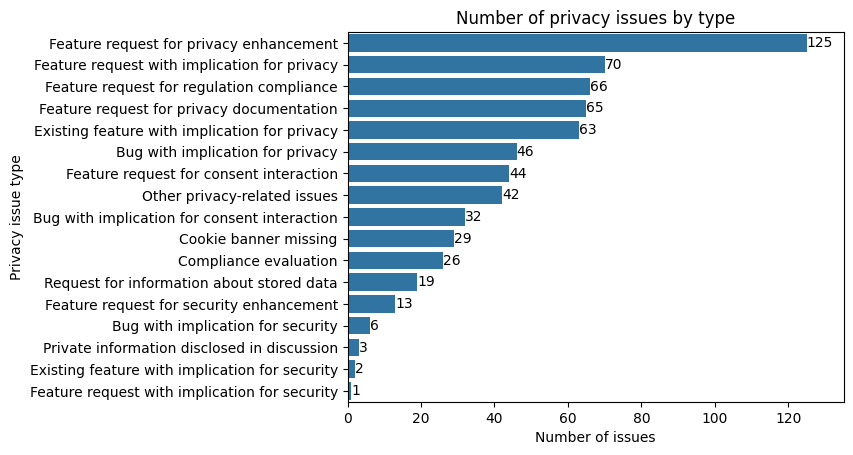

In [7]:
ax = sns.countplot(data=issues, y='privacy_issue', order=issues['privacy_issue'].value_counts().index)
ax.set_xlim(0,135)
ax.bar_label(ax.containers[0])
ax.set_xlabel('Number of issues')
ax.set_ylabel('Privacy issue type')
ax.set_title('Number of privacy issues by type')
plt.savefig('plots/privacy_issue_type_count.pdf', bbox_inches='tight')
plt.show()

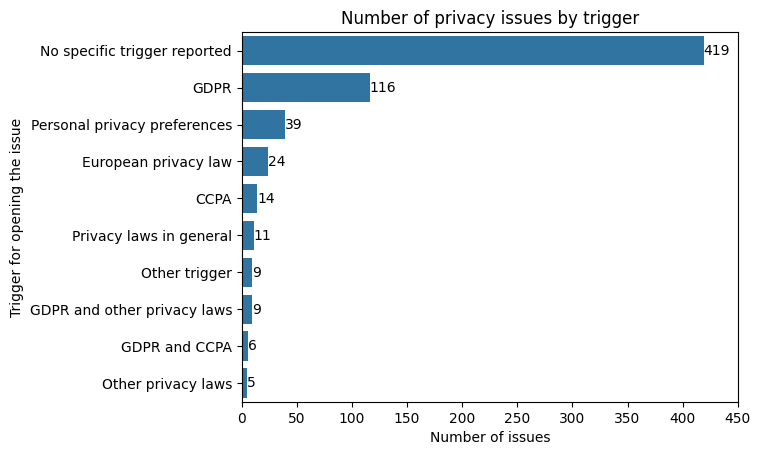

In [8]:
ax = sns.countplot(data=issues, y='trigger', order=issues['trigger'].value_counts().index)
ax.set_xlim(0,450)
ax.bar_label(ax.containers[0])
ax.set_xlabel('Number of issues')
ax.set_ylabel('Trigger for opening the issue')
ax.set_title('Number of privacy issues by trigger')
plt.savefig('plots/trigger_count.pdf', bbox_inches='tight')
plt.show()

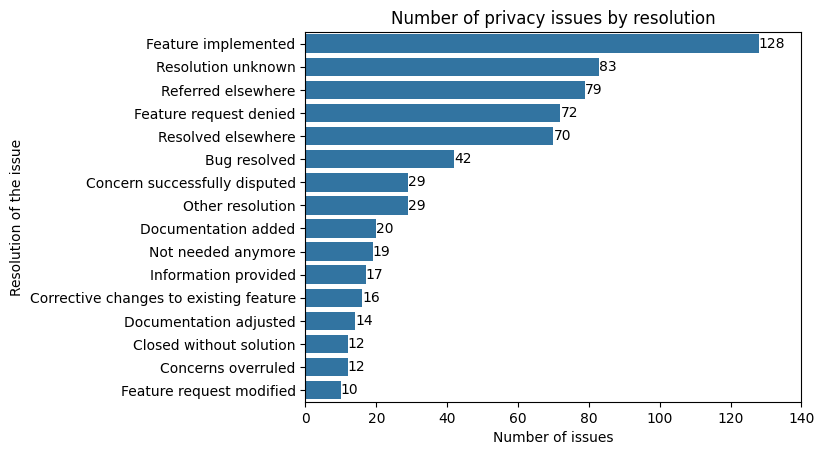

In [9]:
ax = sns.countplot(data=issues, y='resolution', order=issues['resolution'].value_counts().index)
ax.set_xlim(0,140)
ax.bar_label(ax.containers[0])
ax.set_xlabel('Number of issues')
ax.set_ylabel('Resolution of the issue')
ax.set_title('Number of privacy issues by resolution')
plt.savefig('plots/resolution_count.pdf', bbox_inches='tight')
plt.show()

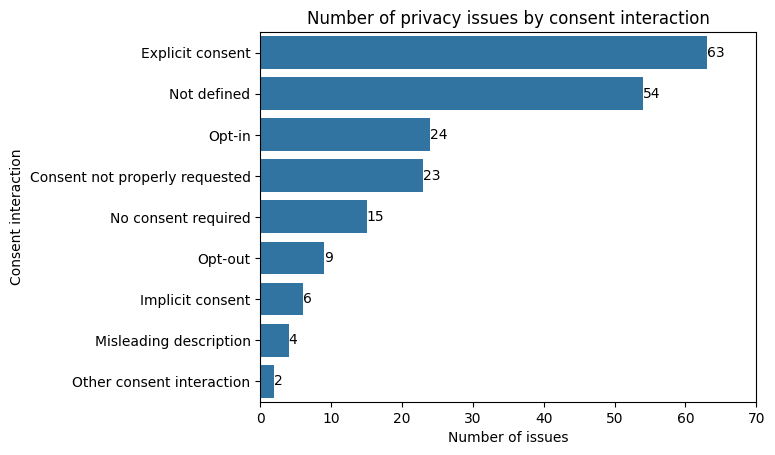

In [10]:
ax = sns.countplot(data=issues[issues['consent_interaction']!='Not applicable'], y='consent_interaction', order=issues['consent_interaction'].value_counts().index.drop('Not applicable'))
ax.set_xlim(0,70)
ax.bar_label(ax.containers[0])
ax.set_xlabel('Number of issues')
ax.set_ylabel('Consent interaction')
ax.set_title('Number of privacy issues by consent interaction')
plt.savefig('plots/consent_interactions.pdf', bbox_inches='tight')
plt.show()

In [11]:
issues.consent_interaction.value_counts()

consent_interaction
Not applicable                    452
Explicit consent                   63
Not defined                        54
Opt-in                             24
Consent not properly requested     23
No consent required                15
Opt-out                             9
Implicit consent                    6
Misleading description              4
Other consent interaction           2
Name: count, dtype: int64

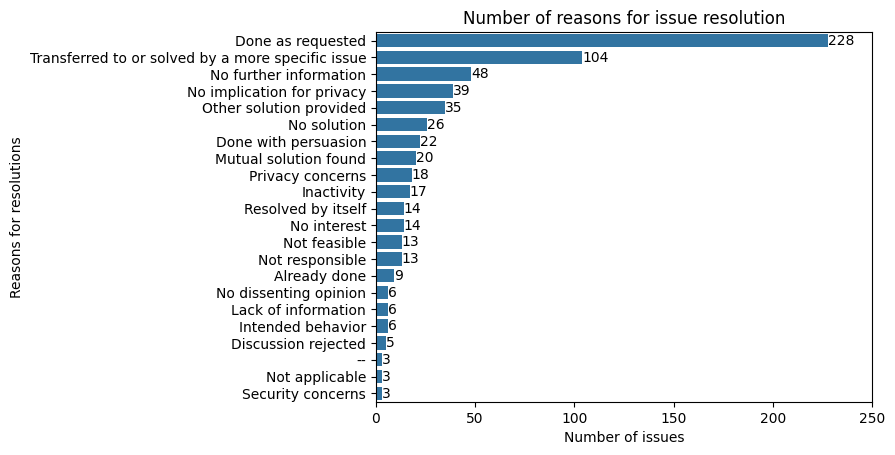

In [12]:
issues['reason_category'] = issues['reason_category'].str.capitalize()
ax = sns.countplot(data=issues, y='reason_category', order=issues['reason_category'].value_counts().index)
ax.set_xlim(0,250)
ax.bar_label(ax.containers[0])
ax.set_xlabel('Number of issues')
ax.set_ylabel('Reasons for resolutions')
ax.set_title('Number of reasons for issue resolution')
plt.savefig('plots/resolution_reason_count.pdf', bbox_inches='tight')
plt.show()

## Compute participant roles

In [13]:
def participant_role(project, username):
    '''
    Returns the role of a participant in a project
    Encoded as integer: 1 for one-time reporter, 2 for frequent reporter, 3 for one-time committer, 4 for frequent committer, 0 for deleted user, i.e., no data available on GH anymore
    '''
    if participants[(participants['project']==project) & (participants['login']==username)].empty:
        raise ValueError('No such participant') 
    commits = participants[(participants['project']==project) & (participants['login']==username)]['commits'].values[0]
    reports = participants[(participants['project']==project) & (participants['login']==username)]['reports'].values[0]
    if commits > 1:
        return 4
    elif commits == 1:
        return 3
    elif reports > 1:
        return 2
    elif reports == 1:
        return 1
    # this can only mean that the user has deleted the GH account
    return 0

def has_discussant_role(project, usernames, role):
    '''
    Returns True if any of the usernames has a discussant role in the project
    '''
    
    for username in usernames:
        if participants[(participants['project']==project) & (participants['login']==username)].empty:
            raise ValueError('No such participant') 
        if participant_role(project, username) == role:
            return True
    return False

def plot_confusion_matrix(y_true, y_pred, labels, title='Confusion matrix', cmap=plt.cm.Blues, filename=None):
    cm = confusion_matrix(y_true, y_pred)
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    df_cm = pd.DataFrame(cm, index = labels, columns = labels)
    df_cm[df_cm==0] = np.nan
    plt.figure(figsize = (10,7))
    sns.heatmap(df_cm, annot=True, cmap=cmap, fmt='.2f')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.title(title)
    if filename is not None:
        plt.savefig(filename, bbox_inches='tight')
    plt.show()

# add the participant role for reporter to dataframe
issues['reporter_role'] = issues.apply(lambda x: participant_role(x['project'], x['reporter']), axis=1)
# add discusant roles
issues['discussants'] = issues['discussants'].apply(lambda x: ast.literal_eval(x))
issues['discussant_role_fc'] = issues.apply(lambda x: has_discussant_role(x['project'], x['discussants'], 4), axis=1)
issues['discussant_role_oc'] = issues.apply(lambda x: has_discussant_role(x['project'], x['discussants'], 3), axis=1)
issues['discussant_role_fr'] = issues.apply(lambda x: has_discussant_role(x['project'], x['discussants'], 2), axis=1)
issues['discussant_role_or'] = issues.apply(lambda x: has_discussant_role(x['project'], x['discussants'], 1), axis=1)

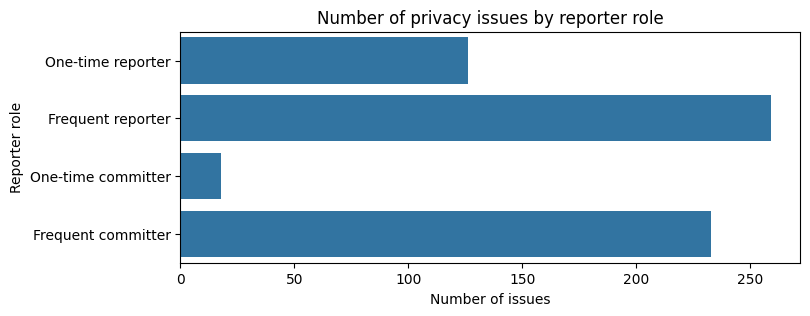

In [14]:
fig, ax = plt.subplots(1,1,figsize=(8,3))
issues['Reporter role'] = 'Unknown'
issues.loc[issues['reporter_role']==0, 'Reporter role'] = 'Deleted user'
issues.loc[issues['reporter_role']==1, 'Reporter role'] = 'One-time reporter'
issues.loc[issues['reporter_role']==2, 'Reporter role'] = 'Frequent reporter'
issues.loc[issues['reporter_role']==3, 'Reporter role'] = 'One-time committer'
issues.loc[issues['reporter_role']==4, 'Reporter role'] = 'Frequent committer'
sns.countplot(data=issues[issues['reporter_role']>0], y="Reporter role", order=['One-time reporter', 'Frequent reporter', 'One-time committer', 'Frequent committer'], ax=ax)
ax.set_xlabel('Number of issues')
ax.set_ylabel('Reporter role')
ax.set_title('Number of privacy issues by reporter role')
plt.savefig('plots/issues_per_reporter.pdf', bbox_inches='tight')
plt.show()
issues.drop(columns=['Reporter role'], inplace=True)

/home/sherbold/git/replication-kit-gh-privavy-issues/.venv/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/sherbold/git/replication-kit-gh-privavy-issues/.venv/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/sherbold/git/replication-kit-gh-privavy-issues/.venv/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence

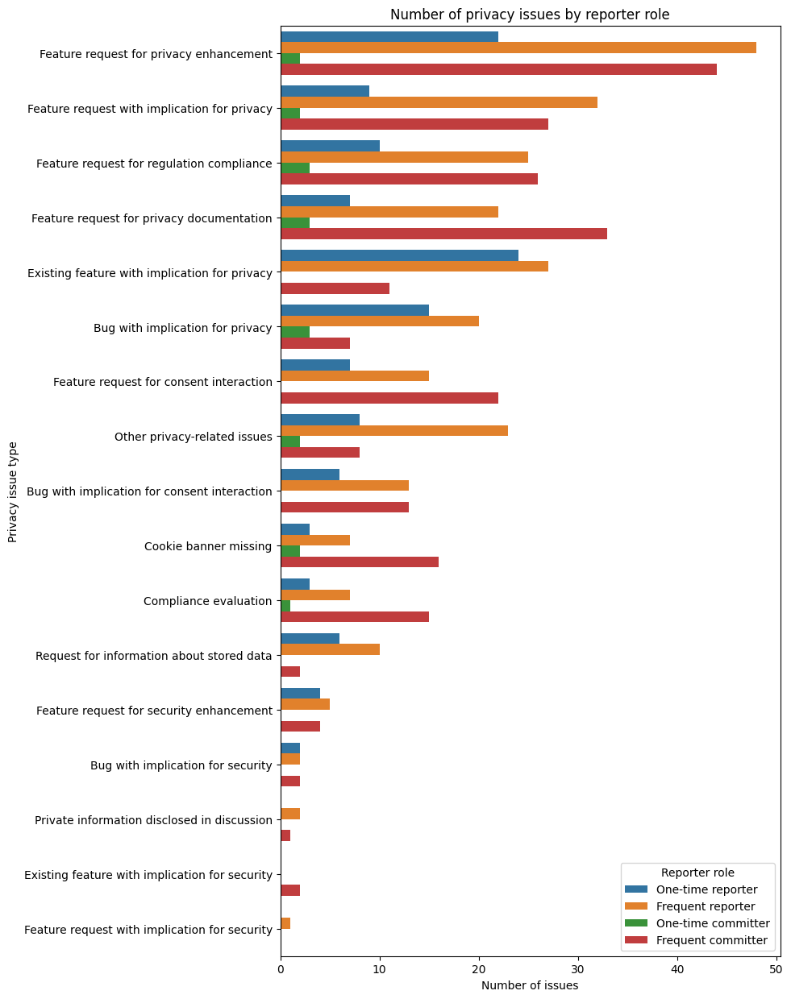

In [15]:
fig, ax = plt.subplots(1,1,figsize=(8,15))
issues['Reporter role'] = 'Unknown'
issues.loc[issues['reporter_role']==0, 'Reporter role'] = 'Deleted user'
issues.loc[issues['reporter_role']==1, 'Reporter role'] = 'One-time reporter'
issues.loc[issues['reporter_role']==2, 'Reporter role'] = 'Frequent reporter'
issues.loc[issues['reporter_role']==3, 'Reporter role'] = 'One-time committer'
issues.loc[issues['reporter_role']==4, 'Reporter role'] = 'Frequent committer'
sns.countplot(data=issues[issues['reporter_role']>0], y="privacy_issue", hue="Reporter role", order=issues['privacy_issue'].value_counts().index, hue_order=['One-time reporter', 'Frequent reporter', 'One-time committer', 'Frequent committer'], ax=ax)
ax.set_xlabel('Number of issues')
ax.set_ylabel('Privacy issue type')
ax.set_title('Number of privacy issues by reporter role')
plt.savefig('plots/issues_per_reporter_grouped.pdf', bbox_inches='tight')
plt.show()
issues.drop(columns=['Reporter role'], inplace=True)

/home/sherbold/git/replication-kit-gh-privavy-issues/.venv/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/sherbold/git/replication-kit-gh-privavy-issues/.venv/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/sherbold/git/replication-kit-gh-privavy-issues/.venv/lib/python3.10/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence

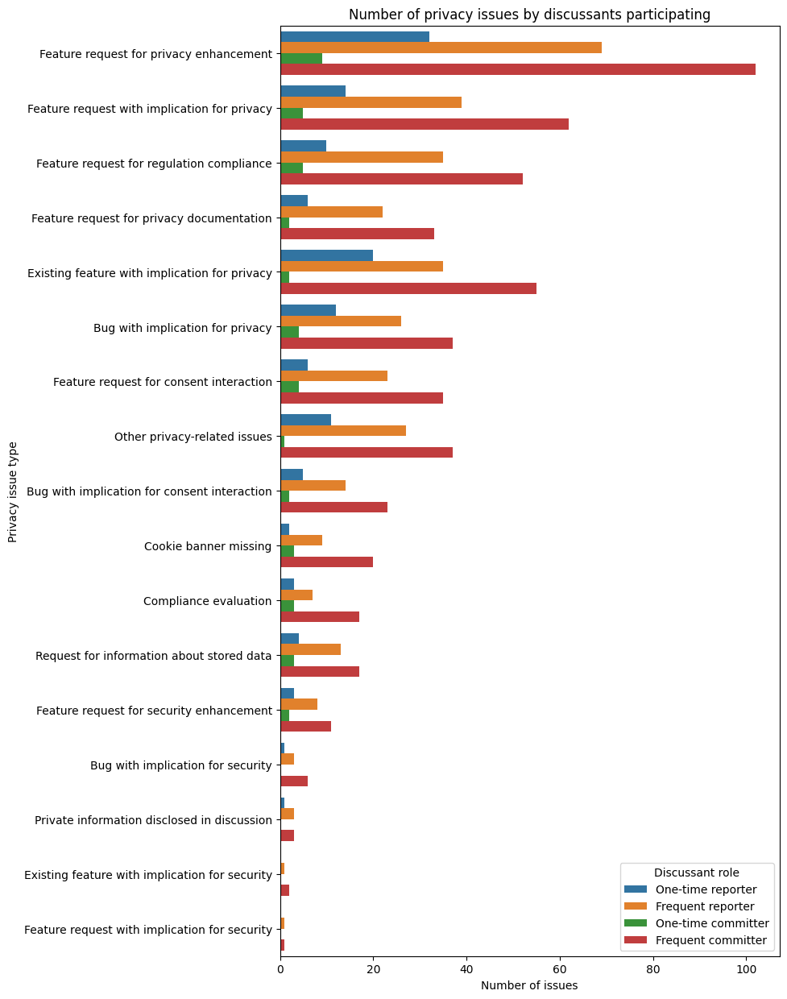

In [16]:
fig, ax = plt.subplots(1,1,figsize=(8,15))

melted_issues = issues[['privacy_issue', 'discussant_role_fc', 'discussant_role_oc', 'discussant_role_fr', 'discussant_role_or']].melt(id_vars='privacy_issue')
melted_issues.loc[melted_issues['variable']=='discussant_role_fc', 'variable'] = 'Frequent committer'
melted_issues.loc[melted_issues['variable']=='discussant_role_oc', 'variable'] = 'One-time committer'
melted_issues.loc[melted_issues['variable']=='discussant_role_fr', 'variable'] = 'Frequent reporter'
melted_issues.loc[melted_issues['variable']=='discussant_role_or', 'variable'] = 'One-time reporter'
melted_issues.rename(columns={'variable':'Discussant role'}, inplace=True)
sns.countplot(data=melted_issues[melted_issues['value']==True], y="privacy_issue", hue="Discussant role", order=issues['privacy_issue'].value_counts().index, hue_order=['One-time reporter', 'Frequent reporter', 'One-time committer', 'Frequent committer'], ax=ax)
ax.set_xlabel('Number of issues')
ax.set_ylabel('Privacy issue type')
ax.set_title('Number of privacy issues by discussants participating')
plt.savefig('plots/issues_per_disussant.pdf', bbox_inches='tight')
plt.show()

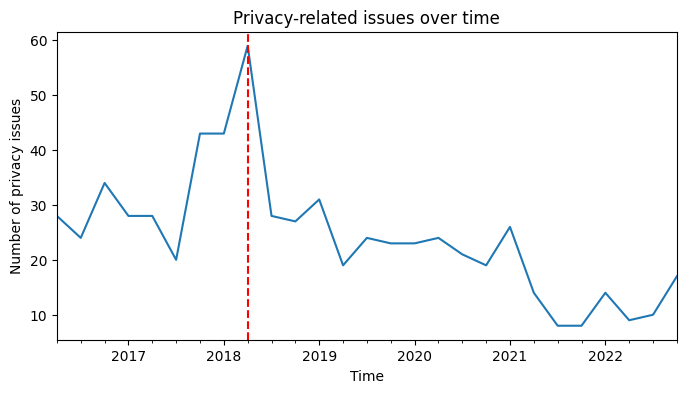

In [17]:
fig, ax = plt.subplots(1,1,figsize=(8,4))
issues['created_at_quarters'] = pd.PeriodIndex(issues['created_at'], freq='Q')
issues.groupby(['created_at_quarters']).count()['privacy_issue'].plot(kind='line')
plt.xlabel('Time')
plt.ylabel('Number of privacy issues')
plt.title('Privacy-related issues over time')
plt.axvline(x=pd.Period('2018Q2', freq='Q'), color='r', linestyle='--')
plt.savefig('plots/issues_over_time.pdf', bbox_inches='tight')
plt.show()

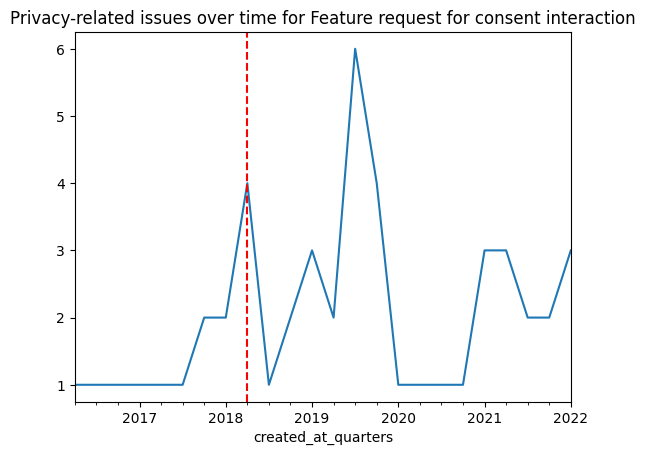

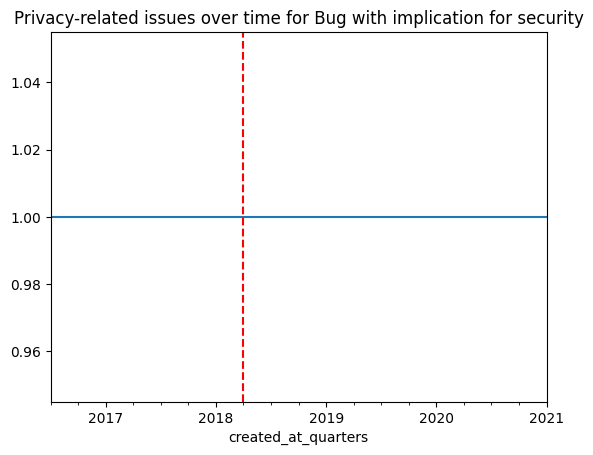

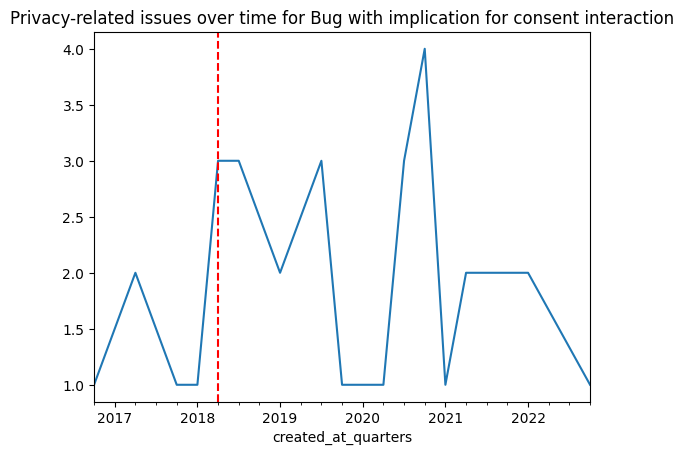

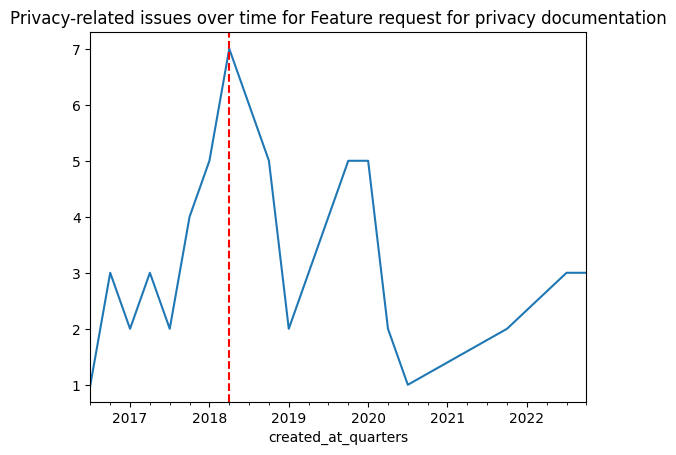

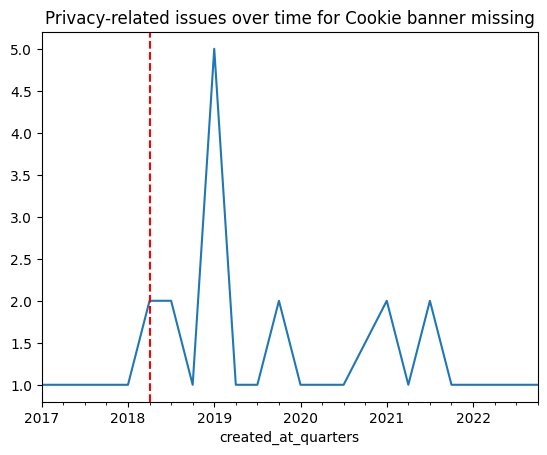

...

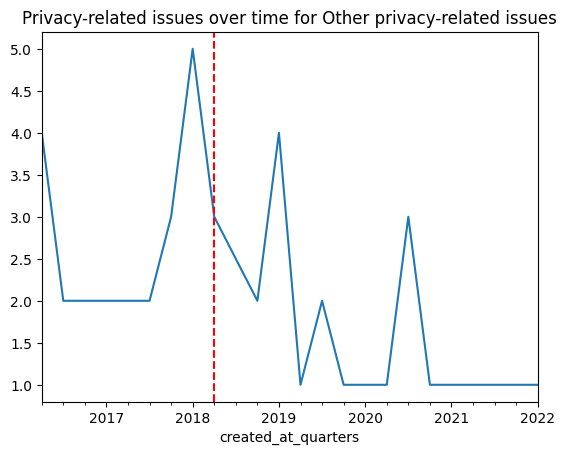

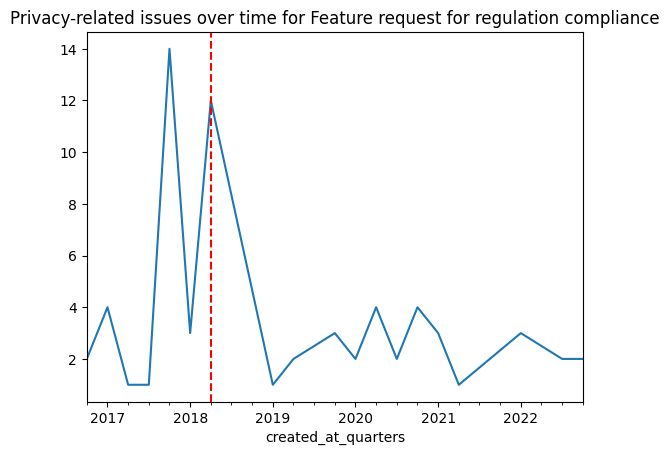

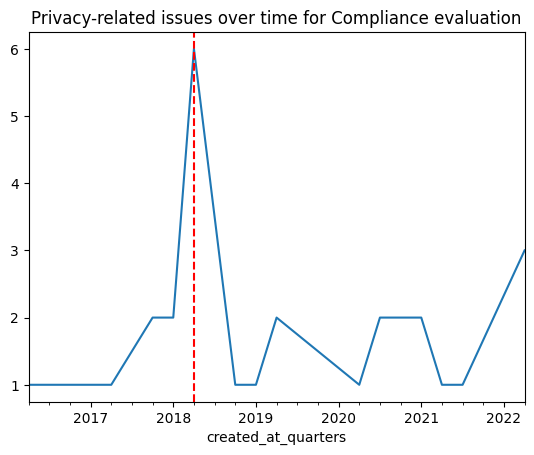

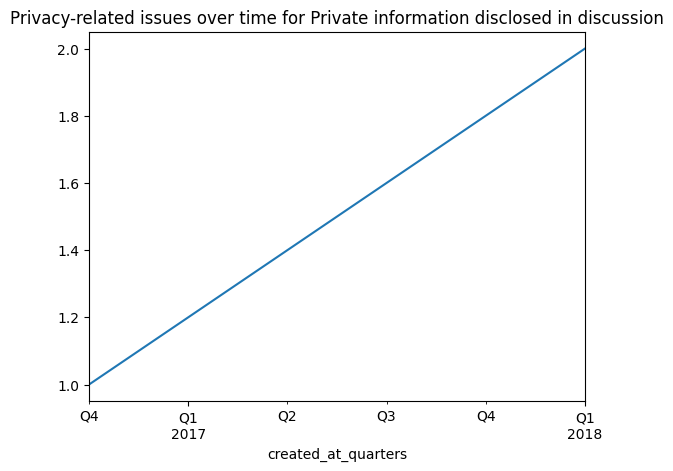

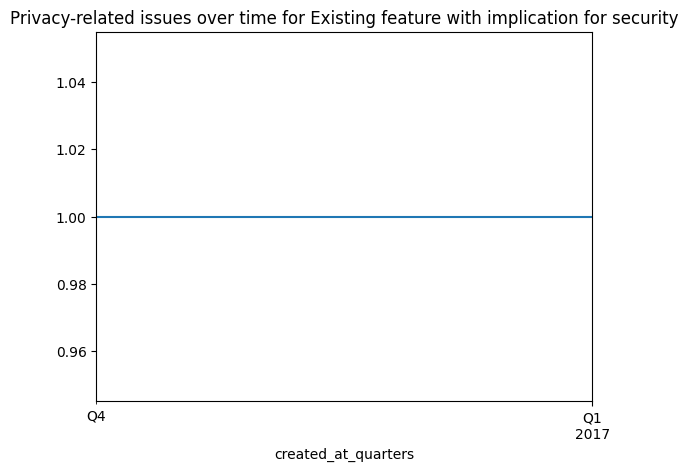

/home/sherbold/git/replication-kit-gh-privavy-issues/.venv/lib/python3.10/site-packages/pandas/plotting/_matplotlib/core.py:1561: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(left, right)


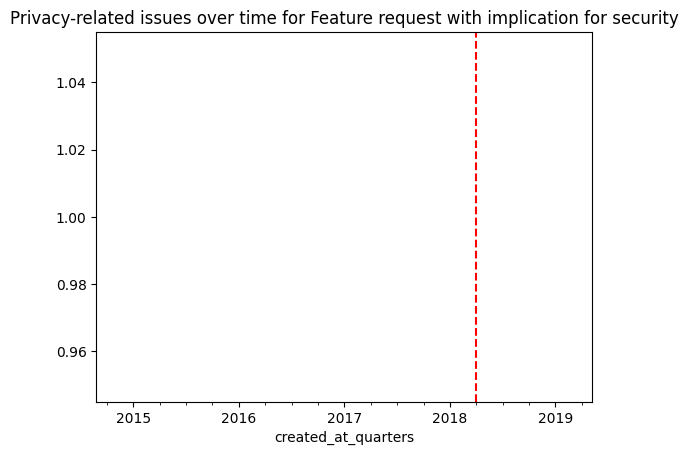

In [18]:
for privacy_issue_type in issues['privacy_issue'].unique():
    issues[issues['privacy_issue']==privacy_issue_type].groupby(['created_at_quarters']).count()['privacy_issue'].plot(kind='line')
    plt.title('Privacy-related issues over time for ' + privacy_issue_type)
    plt.axvline(x=pd.Period('2018Q2', freq='Q'), color='r', linestyle='--')
    plt.show()

# Analyze relationships between variables

## Prepare data

In [19]:
label_mapping_df = pd.read_csv('data/label_merge.csv', sep=';', header=None, names=['original_labels', 'merged_labels'])
label_map = {}
for index, row in label_mapping_df.iterrows():
    label_map[row['original_labels']] = row['merged_labels']

def map_labels(labels):
    labels = ast.literal_eval(labels)
    labels = list(set([label_map[label.encode('utf-8', 'replace').decode('utf-8', 'replace')] for label in labels]))
    return labels

issues['mapped_labels'] = issues['labels'].apply(lambda x: map_labels(x))
for label in set(label_map.values()):
    issues['label_'+label] = issues['mapped_labels'].apply(lambda x: label in x)

issues_onehot = pd.get_dummies(issues, columns=['privacy_issue', 'consent_interaction', 'trigger', 'reporter_role'])

indepedent_variables_strs = ('#comments', '#discussants', 'privacy_issue_', 'consent_interaction_',
       'trigger_', 'reporter_role_', 'discussant_role_', 'label_')

# 'template_mentions_privacy'
indepedent_variables_mask = issues_onehot.columns.str.startswith(indepedent_variables_strs)


indepedent_variables = issues_onehot.loc[:,indepedent_variables_mask].copy()
indepedent_variables.drop(columns=['reporter_role_0'], inplace=True) # dropping is reporters deleted their account
indepedent_variables = indepedent_variables.apply(lambda x: x.astype(int))
indepedent_variables_norm = indepedent_variables.apply(lambda x: (x - np.mean(x)) / (np.max(x) - np.min(x)))
dependent_variable = issues_onehot['resolution']

In [20]:
contingency = pd.crosstab(issues.loc[issues['reporter_role']>0, 'privacy_issue'], issues.loc[issues['reporter_role']>0, 'reporter_role'], margins=True)
display(contingency)

print('Chi2 test for reporter role and privacy issue type with issues that we observe at least 20 times')
chi2, p, dof, expected = chi2_contingency(contingency[contingency['All']>20].drop(columns=['All']).drop(index=['All']))
print('Chi2: ', chi2)
print('p: ', p)

reporter_role,1,2,3,4,All
privacy_issue,,,,,
Bug with implication for consent interaction,6,13,0,13,32
Bug with implication for privacy,15,20,3,7,45
Bug with implication for security,2,2,0,2,6
Compliance evaluation,3,7,1,15,26
Cookie banner missing,3,7,2,16,28
Existing feature with implication for privacy,24,27,0,11,62
Existing feature with implication for security,0,0,0,2,2
Feature request for consent interaction,7,15,0,22,44
Feature request for privacy documentation,7,22,3,33,65


Chi2 test for reporter role and privacy issue type with issues that we observe at least 20 times
Chi2:  67.35268702689874
p:  0.00010881202254297942


In [21]:
contingency = pd.crosstab(issues['privacy_issue'], columns=[issues['discussant_role_or'], issues['discussant_role_fr'], issues['discussant_role_oc'], issues['discussant_role_fc']], margins=True)

display(contingency)

print('Chi2 test for reporter role and privacy issue type with issues that we observe at least 20 times')
chi2, p, dof, expected = chi2_contingency(contingency[contingency['All']>20].drop(columns=['All']).drop(index=['All']))
print('Chi2: ', chi2)
print('p: ', p)

discussant_role_or                             False                                        True                                        All
discussant_role_fr                             False                  True                 False                  True                     
discussant_role_oc                             False       True      False       True      False       True      False       True          
discussant_role_fc                             False True False True False True False True False True False True False True False True     
privacy_issue                                                                                                                              
Bug with implication for consent interaction       4    9     0    1     3    9     1    0     1    3     0    0     0    1     0    0   32
Bug with implication for privacy                   1   13     1    1     6   10     0    2     0    4     0    0     1    7     0    0   46
Bug with implication for security                  0    3     0    0     0    2     0    0     0    0     0    0     0    1     0    0    6
Compliance evaluation                              6   11     0    0     1    4     0    1     1    0     1    0     0    0     0    1   26
Cookie banner missing                              8    8     0    2     1    7     0    1     0    2     0    0     0    0     0    0   29
Existing feature with implication for privacy      3   17     0    0     2   20     0    1     1    6     0    1     2   10     0    0   63
Existing feature with implication for security     0    1     0    0     0    1     0    0     0    0     0    0     0    0     0    0    2
Feature request for consent interaction            4   13     1    0     1   17     1    1     1    1     0    1     1    2     0    0   44
Feature request for privacy documentation         20   18     0    1    11    8     0    1     1    3     0    0     0    2     0    0   65
Feature request for privacy enhancement            9   35     2    2     8   35     1    1     0    8     0    0     2   19     1    2  125
Feature request for regulation compliance          7   19     0    3     6   20     0    1     0    2     0    0     1    6     0    1   66
Feature request for security enhancement           2    2     0    0     0    4     0    2     0    1     0    0     0    2     0    0   13
Feature request with implication for privacy       2   22     0    1     3   25     1    2     0    5     0    1     2    6     0    0   70
Feature request with implication for security      0    0     0    0     0    1     0    0     0    0     0    0     0    0     0    0    1
Other privacy-related issues                       0   11     0    0     5   14     0    1     0    4     0    0     0    7     0    0   42
Private information disclosed in discussion        0    0     0    0     0    2     0    0     0    0     0    0     0    1     0    0    3
Request for information about stored data          1    3     0    1     1    8     0    1     0    1     0    0     0    2     0    1   19
All                                               67  185     4   12    48  187     4   15     5   40     1    3     9   66     1    5  652

Chi2 test for reporter role and privacy issue type with issues that we observe at least 20 times
Chi2:  198.0286484911084
p:  0.005235060858297631


Correlation analysis

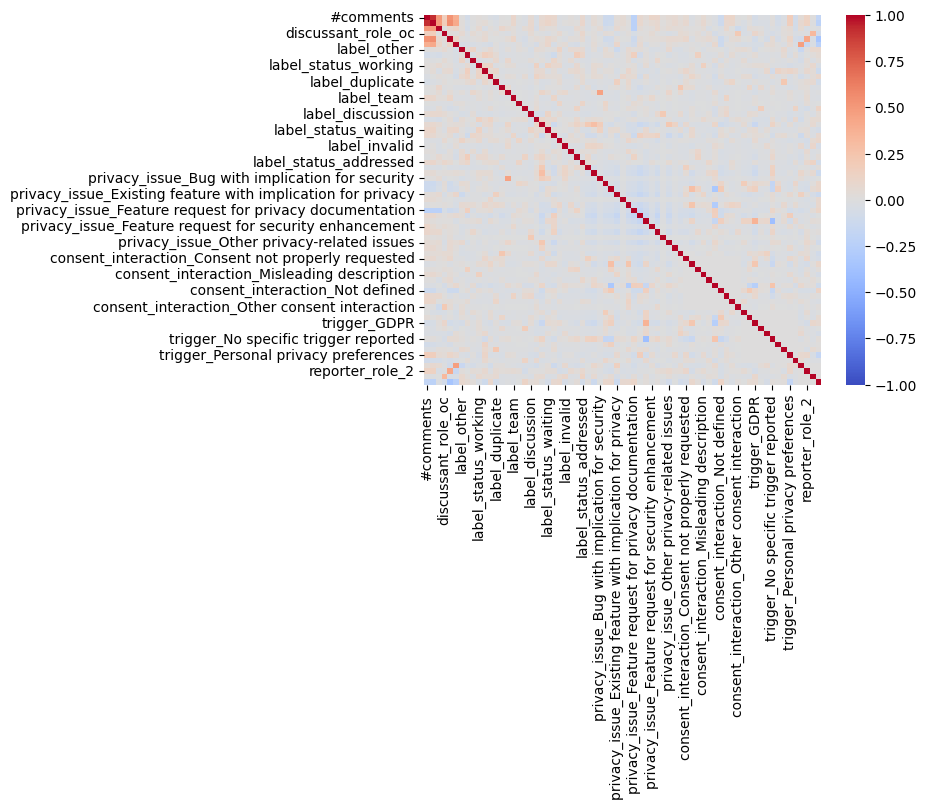

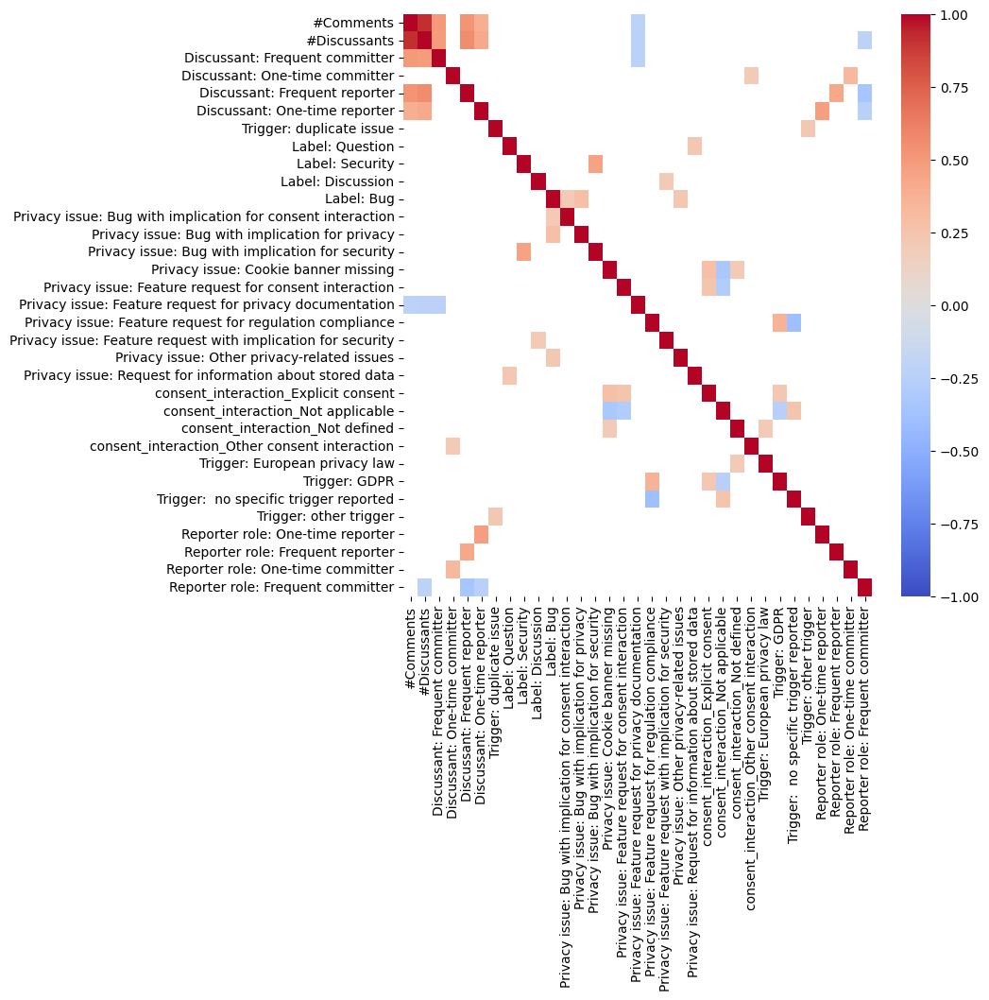

In [22]:
# plot correlation heatmap of independent variables
corr = indepedent_variables.corr(method='spearman')
# set correlations between one-hot encoded variables to 0
for row in corr.index:
    for col in corr.columns:
        if row != col and row.startswith('reporter_role_') and col.startswith('reporter_role_'):
            corr.loc[row, col] = 0
        if row != col and row.startswith('consent_interaction_') and col.startswith('consent_interaction_'):
            corr.loc[row, col] = 0
        if row != col and row.startswith('trigger_') and col.startswith('trigger_'):
            corr.loc[row, col] = 0

# visualize the correlation matrix
sns.heatmap(corr, vmin=-1, vmax=1, center=0, cmap='coolwarm')
plt.show()

# visualize correlations larger than abs(0.2)
corr_abs = corr.abs()

corr_abs_larger = corr[corr_abs > 0.2]

corr_abs_larger.isna().sum(axis=1)
corr_mask = corr_abs_larger.isna().sum(axis=1) < len(corr_abs_larger.columns) - 1
corr_masked = corr_abs_larger.loc[corr_mask, corr_mask]

corr_label_map = {
    '#comments': '#Comments',
    '#discussants': '#Discussants',
    'reporter_role_1': 'Reporter role: One-time reporter',
    'reporter_role_2': 'Reporter role: Frequent reporter',
    'reporter_role_3': 'Reporter role: One-time committer',
    'reporter_role_4': 'Reporter role: Frequent committer',
    'discussant_role_fc': 'Discussant: Frequent committer',
    'discussant_role_oc': 'Discussant: One-time committer',
    'discussant_role_fr': 'Discussant: Frequent reporter',
    'discussant_role_or': 'Discussant: One-time reporter',
    'label_bug': 'Label: Bug',
    'label_question': 'Label: Question',
    'label_discussion': 'Label: Discussion',
    'label_security': 'Label: Security',
    'privacy_issue_Bug with implication for consent interaction': 'Privacy issue: Bug with implication for consent interaction',
    'privacy_issue_Bug with implication for privacy': 'Privacy issue: Bug with implication for privacy',
    'privacy_issue_Bug with implication for security': 'Privacy issue: Bug with implication for security',
    'privacy_issue_Compliance evaluation': 'Privacy issue: Compliance evaluation',
    'privacy_issue_Cookie banner missing': 'Privacy issue: Cookie banner missing',
    'privacy_issue_Existing feature with implication for privacy': 'Privacy issue: Existing feature with implication for privacy',
    'privacy_issue_Existing feature with implication for security': 'Privacy issue: Existing feature with implication for security',
    'privacy_issue_Feature request denied': 'Privacy issue: Feature request denied',
    'privacy_issue_Feature request for consent interaction': 'Privacy issue: Feature request for consent interaction',
    'privacy_issue_Feature request for privacy documentation': 'Privacy issue: Feature request for privacy documentation',
    'privacy_issue_Feature request for privacy enhancement': 'Privacy issue: Feature request for privacy enhancement',
    'privacy_issue_Feature request for regulation compliance': 'Privacy issue: Feature request for regulation compliance',
    'privacy_issue_Feature request for security enhancement': 'Privacy issue: Feature request for security enhancement',
    'privacy_issue_Feature request modified': 'Privacy issue: Feature request modified',
    'privacy_issue_Information provided': 'Privacy issue: Information provided',
    'privacy_issue_Not needed anymore': 'Privacy issue: Not needed anymore',
    'privacy_issue_Feature request with implication for security': 'Privacy issue: Feature request with implication for security',
    'privacy_issue_Other privacy-related issues': 'Privacy issue: Other privacy-related issues',
    'privacy_issue_Request for information about stored data': 'Privacy issue: Request for information about stored data',
    'consent_interaction_explicit consent': 'Consent interaction: explicit consent',
    'consent_interaction_not applicable': 'Consent interaction: not applicable',
    'consent_interaction_not defined': 'Consent interaction: not defined',
    'consent_interaction_other': 'Consent interaction: other',
    'trigger_European privacy law': 'Trigger: European privacy law',
    'trigger_GDPR': 'Trigger: GDPR',
    'trigger_No specific trigger reported': 'Trigger:  no specific trigger reported',
    'trigger_Other trigger': 'Trigger: other trigger',
    'label_duplicate': 'Trigger: duplicate issue',
}
corr_masked = corr_masked.rename(index=corr_label_map, columns=corr_label_map)
corr_masked_order = ['#Comments', '#Discussants',
                     'Discussant: Frequent committer', 'Discussant: One-time committer', 'Discussant: Frequent reporter', 'Discussant: One-time reporter',
                     'Reporter role: One-time reporter', 'Reporter role: Frequent reporter', 'Reporter role: One-time committer', 'Reporter role: Frequent committer',
                     'Label: Bug', 'Label: Question', 'Label: Discussion', 'Trigger: duplicate issue', 'Label: Security',
                     'Privacy issue: Bug with implication for consent interaction', 'Privacy issue: Bug with implication for privacy', 'Privacy issue: Bug with implication for security', 'Privacy issue: Cookie banner missing', 'Privacy issue: Feature request for consent interaction', 'Privacy issue: Feature request for privacy documentation', 'Privacy issue: Feature request for regulation compliance', 'Privacy issue: Feature request with implication for security', 'Privacy issue: Other privacy-related issues', 'Privacy issue: Request for information about stored data',
                     'Consent interaction: explicit consent', 'Consent interaction: not applicable', 'Consent interaction: not defined', 'Consent interaction: other',
                     'Trigger: European privacy law', 'Trigger: GDPR', 'Trigger:  no specific trigger reported', 'Trigger: other trigger']
#corr_masked = corr_masked.loc[corr_masked_order, corr_masked_order]

plt.figure(figsize=(8,8))

sns.heatmap(corr_masked, vmin=-1, vmax=1, center=0, cmap='coolwarm')
plt.savefig('plots/correlation_heatmap.pdf', bbox_inches='tight')
plt.show()



In [23]:
corr_masked

,#Comments,#Discussants,Discussant: Frequent committer,Discussant: One-time committer,Discussant: Frequent reporter,Discussant: One-time reporter,Trigger: duplicate issue,Label: Question,Label: Security,Label: Discussion,Label: Bug,Privacy issue: Bug with implication for consent interaction,Privacy issue: Bug with implication for privacy,Privacy issue: Bug with implication for security,Privacy issue: Cookie banner missing,Privacy issue: Feature request for consent interaction,Privacy issue: Feature request for privacy documentation,Privacy issue: Feature request for regulation compliance,Privacy issue: Feature request with implication for security,Privacy issue: Other privacy-related issues,Privacy issue: Request for information about stored data,consent_interaction_Explicit consent,consent_interaction_Not applicable,consent_interaction_Not defined,consent_interaction_Other consent interaction,Trigger: European privacy law,Trigger: GDPR,Trigger: no specific trigger reported,Trigger: other trigger,Reporter role: One-time reporter,Reporter role: Frequent reporter,Reporter role: One-time committer,Reporter role: Frequent committer
#Comments,1.000000,0.915157,0.494891,NaN,0.527600,0.382825,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.224510,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
#Discussants,0.915157,1.000000,0.490615,NaN,0.559862,0.420529,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.230770,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.224410
Discussant: Frequent committer,0.494891,0.490615,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.226781,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Discussant: One-time committer,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.203726,NaN,NaN,NaN,NaN,NaN,NaN,0.323411,NaN
Discussant: Frequent reporter,0.527600,0.559862,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.425969,NaN,-0.343967
Discussant: One-time reporter,0.382825,0.420529,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.475193,NaN,NaN,-0.243974
Trigger: duplicate issue,NaN,NaN,NaN,NaN,NaN,NaN,1.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.22563,NaN,NaN,NaN,NaN
Label: Question,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.226629,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Label: Security,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,0.457532,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Label: Discussion,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.209734,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Random Forest

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters:  {'min_samples_split': 10, 'min_samples_leaf': 4, 'max_depth': 8, 'bootstrap': True}


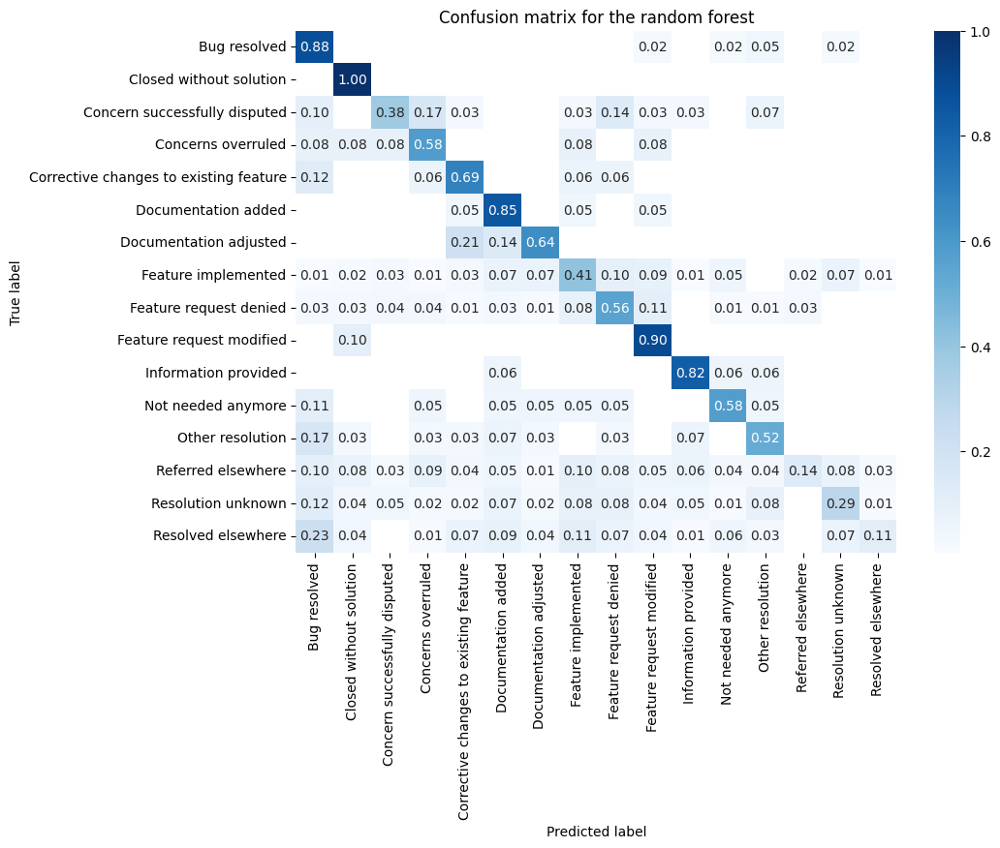

In [178]:
max_depth = [int(x) for x in np.linspace(2, 10, num = 5)]
min_samples_split = [5, 10, 20, 40]
min_samples_leaf = [4, 8, 16]
bootstrap = [True, False]
# Create the random grid
random_grid = {'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}



clf_rf_rand = RandomForestClassifier(n_estimators=100, class_weight='balanced')
rf_random = RandomizedSearchCV(estimator = clf_rf_rand, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=1, random_state=42, n_jobs = -1)
rf_random.fit(indepedent_variables, dependent_variable)
print("Best parameters: ", rf_random.best_params_)
plot_confusion_matrix(dependent_variable, rf_random.predict(indepedent_variables), labels=rf_random.classes_, title='Confusion matrix for the random forest', filename='plots/confusion_matrix_rf.pdf')


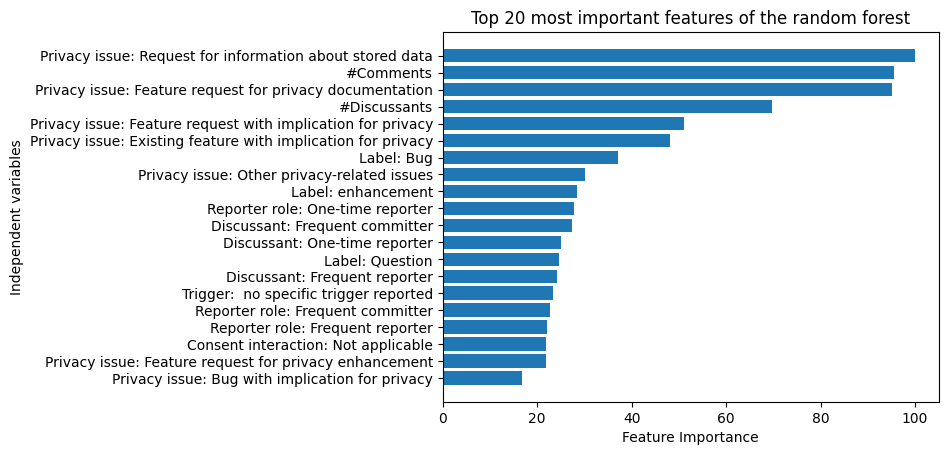

In [182]:
corr_label_map['label_other'] = 'Label: other'
corr_label_map['label_enhancement'] = 'Label: enhancement'
corr_label_map['consent_interaction_Not applicable'] = 'Consent interaction: Not applicable'
corr_label_map['privacy_issue_Feature request with implication for privacy'] = 'Privacy issue: Feature request with implication for privacy'

# plot feature importance
n_important_features = 20
feature_importance = rf_random.best_estimator_.feature_importances_
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
sorted_idx = sorted_idx[-n_important_features:]
pos = np.arange(sorted_idx.shape[0]) + .5
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, indepedent_variables.columns[sorted_idx])
# rename features using corr_label_map
plt.yticks(pos, [corr_label_map[x] for x in indepedent_variables.columns[sorted_idx]])
plt.xlabel('Feature Importance')
plt.ylabel('Independent variables') 
plt.title('Top %d most important features of the random forest' % n_important_features)
plt.savefig('plots/variable_importance_rf.pdf', bbox_inches='tight')
plt.show()


## Decision Tree

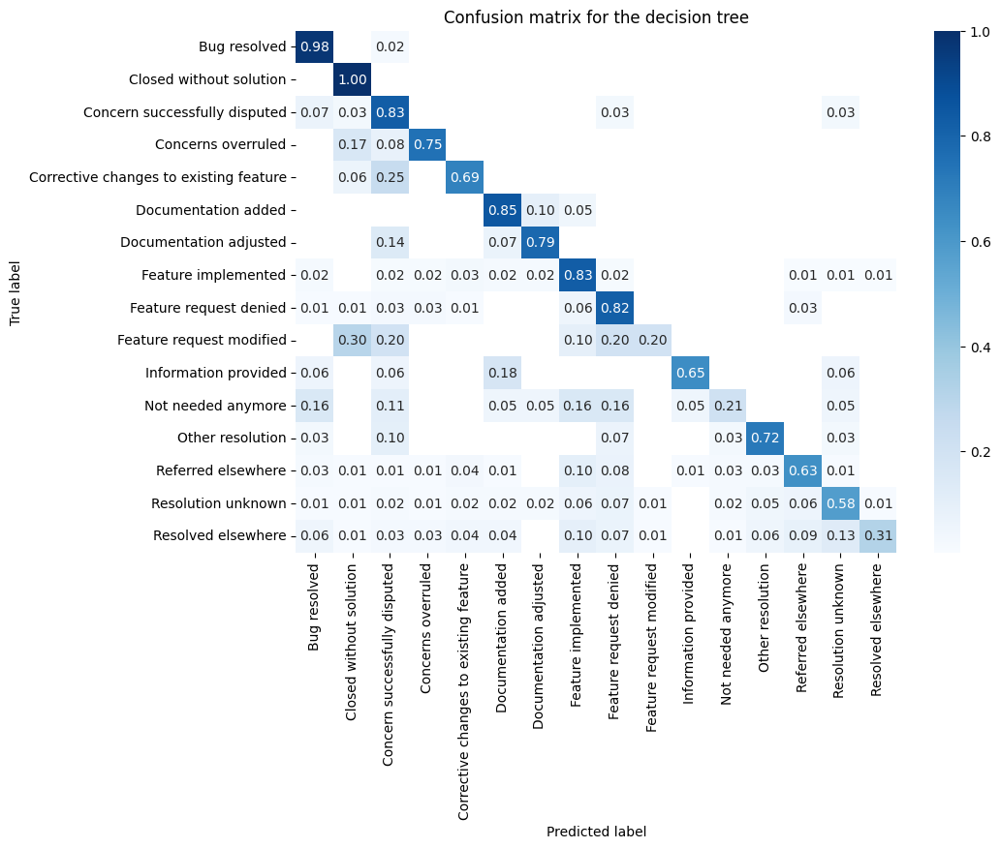

In [151]:
clf_dt = DecisionTreeClassifier(random_state=0, min_samples_leaf=2)

clf_dt.fit(indepedent_variables, dependent_variable)
plot_confusion_matrix(dependent_variable, clf_dt.predict(indepedent_variables), labels=clf_dt.classes_, title='Confusion matrix for the decision tree', filename='plots/confusion_matrix_decision_tree.pdf')

In [139]:
from sklearn import tree
fig, ax = plt.subplots(1,1,figsize=(400,80))
tree.plot_tree(clf_dt, ax=ax, feature_names=indepedent_variables.columns, class_names=clf_dt.classes_, filled=True)
plt.savefig('plots/decision_tree.png', bbox_inches='tight')
plt.show()

In [143]:
# stats about decision tree
print('Number of nodes: ', clf_dt.tree_.node_count)
print('Depth of tree: ', clf_dt.tree_.max_depth)
print('Number of leaves: ', clf_dt.tree_.n_leaves)

Number of nodes:  515
Depth of tree:  24
Number of leaves:  258


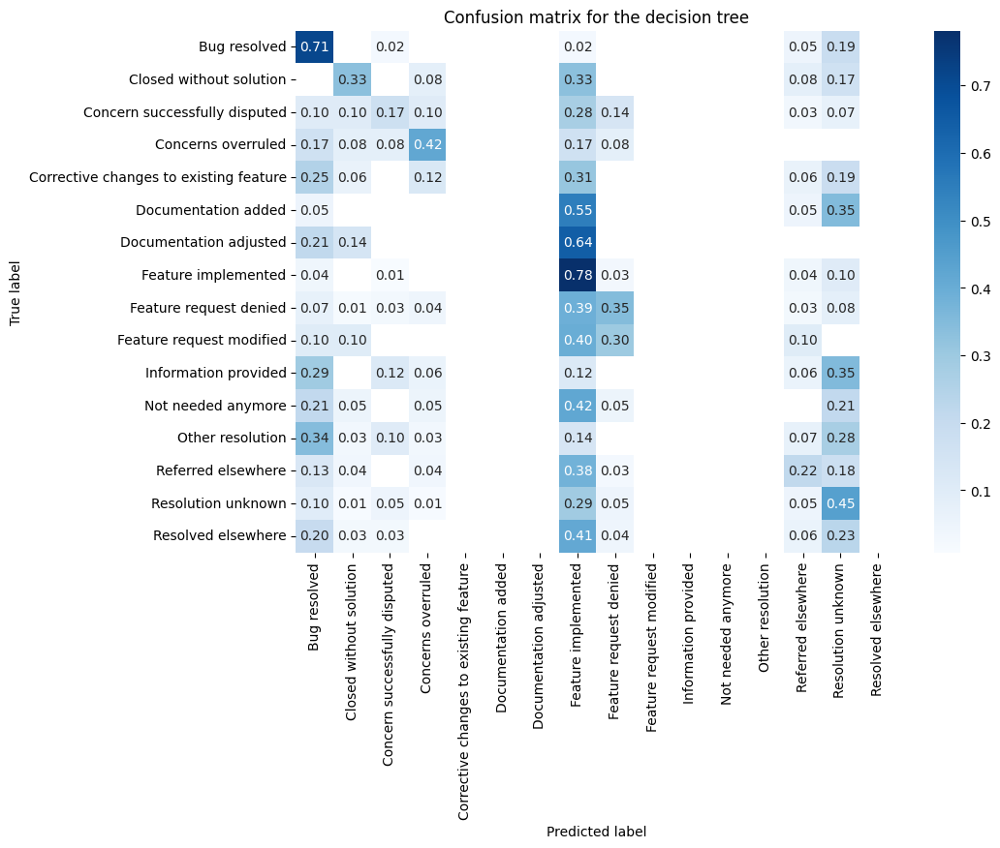

In [154]:
clf_dt_restricted = DecisionTreeClassifier(random_state=0, min_samples_leaf=20)

clf_dt_restricted.fit(indepedent_variables, dependent_variable)
plot_confusion_matrix(dependent_variable, clf_dt_restricted.predict(indepedent_variables), labels=clf_dt_restricted.classes_, title='Confusion matrix for the decision tree', filename='plots/confusion_matrix_decision_tree.pdf')

## Multinomial Logit Model

In [29]:
import statsmodels.api as sm

# drop low support variables
minSupport = 25
print('Dropping variables because they appear in less than 5 instances: ', '')
for col in indepedent_variables.columns:
    if indepedent_variables[col].sum() < minSupport:
        print(col)
        
indepedent_variables_norm_freq = indepedent_variables_norm.loc[:,indepedent_variables.sum()>minSupport]

logit_model = sm.MNLogit(pd.get_dummies(dependent_variable), sm.add_constant(indepedent_variables_norm_freq))

logit_result = logit_model.fit(method='cg', maxiter=10000)
logit_summary = logit_result.summary()

Dropping variables because they appear in less than 5 instances:  
label_documentation
label_severity_low
label_status_triage
label_duplicate
label_question
label_security
label_team
label_policy
label_task
label_discussion
label_invalid
label_status_qa
label_severity_medium
label_status_addressed
privacy_issue_Bug with implication for security
privacy_issue_Existing feature with implication for security
privacy_issue_Feature request for security enhancement
privacy_issue_Feature request with implication for security
privacy_issue_Private information disclosed in discussion
privacy_issue_Request for information about stored data
consent_interaction_Consent not properly requested
consent_interaction_Implicit consent
consent_interaction_Misleading description
consent_interaction_No consent required
consent_interaction_Opt-in
consent_interaction_Opt-out
consent_interaction_Other consent interaction
trigger_CCPA
trigger_European privacy law
trigger_GDPR and CCPA
trigger_GDPR and other priv

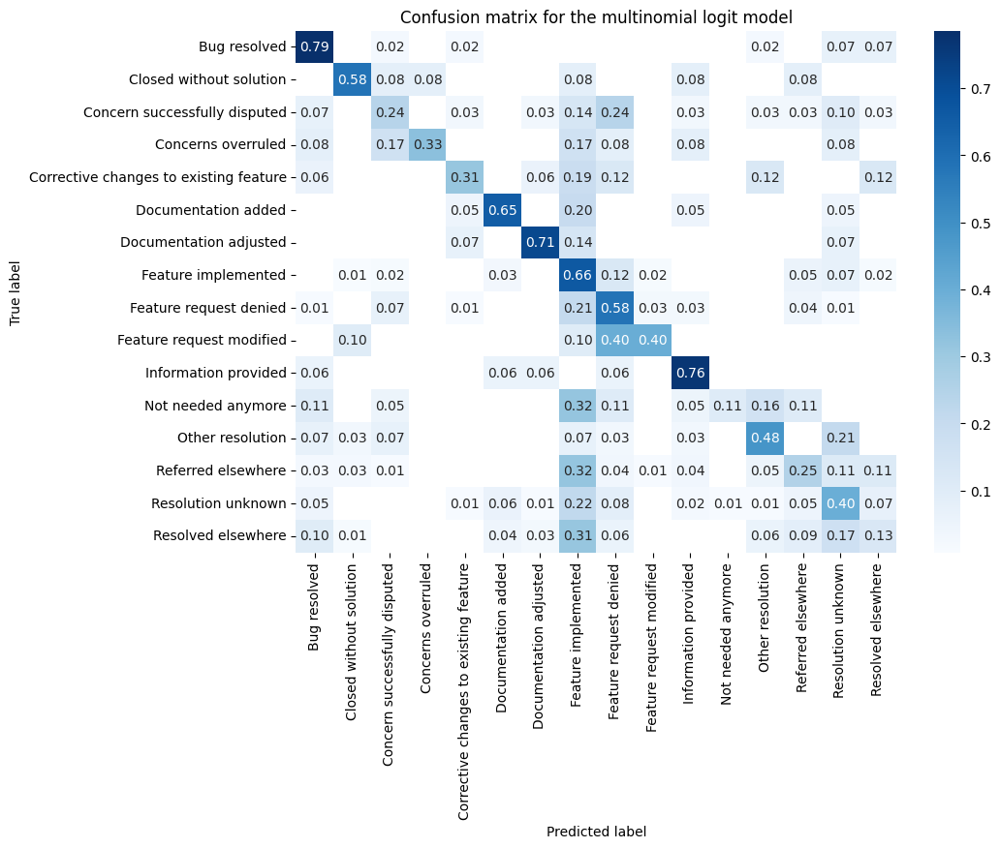

In [153]:
labels = rf_random.classes_
title = 'Confusion matrix for the multinomial logit model'
cmap = plt.cm.Blues

cm = logit_result.pred_table()
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
df_cm = pd.DataFrame(cm, index = labels, columns = labels)
df_cm[df_cm==0] = np.nan
plt.figure(figsize = (10,7))
sns.heatmap(df_cm, annot=True, cmap=cmap, fmt='.2f')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title(title)
plt.savefig('plots/confusion_matrix_logit.pdf', bbox_inches='tight')
plt.show()

In [130]:
result_table = logit_result.get_margeff(at='overall').summary_frame()

for dep_var in sorted(dependent_variable.unique()):
    data_for_var = result_table.loc['y='+dep_var, :]
    sig_results = data_for_var['Pr(>|z|)']<0.05
    print(dep_var)
    for indep_var in data_for_var[sig_results].index:
          print('%f (p = %f) - %s' % (data_for_var.loc[indep_var, 'dy/dx'],
                                      data_for_var.loc[indep_var, 'Pr(>|z|)'],
                                      indep_var))
    print()
    print('----------------')
    print()

Bug resolved
-0.486792 (p = 0.036941) - #discussants
0.058223 (p = 0.036236) - discussant_role_or

----------------

Closed without solution
0.267356 (p = 0.016047) - #comments
0.053043 (p = 0.026314) - discussant_role_or

----------------

Concern successfully disputed
0.725712 (p = 0.031540) - #comments
-0.987683 (p = 0.026864) - #discussants
0.063812 (p = 0.005740) - discussant_role_fr

----------------

Concerns overruled

----------------

Corrective changes to existing feature
0.526186 (p = 0.014669) - #comments

----------------

Documentation added
0.043874 (p = 0.033203) - discussant_role_or

----------------

Documentation adjusted
-1.532470 (p = 0.038371) - #comments

----------------

Feature implemented
2.596875 (p = 0.000003) - #comments
-1.075496 (p = 0.006367) - #discussants

----------------

Feature request denied
-0.068610 (p = 0.034266) - discussant_role_or

----------------

Feature request modified

----------------

Information provided
-0.034560 (p = 0.022840) -

In [123]:
result_table

dy/dx  Std. Err.         z  Pr(>|z|)  Conf. Int. Low  Cont. Int. Hi.
endog                exog                                                                                                         
y=Bug resolved       #comments                             0.392183   0.359780  1.090066  0.275684       -0.312972        1.097338
                     #discussants                         -0.486792   0.233315 -2.086419  0.036941       -0.944080       -0.029504
                     discussant_role_fc                   -0.010408   0.646869 -0.016090  0.987163       -1.278247        1.257431
                     discussant_role_oc                    0.102698   1.570802  0.065379  0.947872       -2.976018        3.181414
                     discussant_role_fr                    0.030373   0.018088  1.679165  0.093120       -0.005079        0.065825
...                                                             ...        ...       ...       ...             ...             ...
y=Resolved elsewhere trigger_No specific trigger reported -0.040245   0.143174 -0.281089  0.778642       -0.320862        0.240372
                     trigger_Personal privacy preferences -1.100856  26.759687 -0.041139  0.967185      -53.548879       51.347166
                     reporter_role_1                      -0.158331   1.108775 -0.142798  0.886449       -2.331490        2.014827
                     reporter_role_2                      -0.197555   1.108589 -0.178204  0.858563       -2.370349        1.975239
                     reporter_role_4                      -0.116827   1.108388 -0.105402  0.916057       -2.289227        2.055574

[544 rows x 6 columns]

In [123]:
print(logit_summary)

                          MNLogit Regression Results                          
Dep. Variable:                      y   No. Observations:                  652
Model:                        MNLogit   Df Residuals:                      127
Method:                           MLE   Df Model:                          510
Date:                Wed, 07 Feb 2024   Pseudo R-squ.:                  0.4062
Time:                        13:07:16   Log-Likelihood:                -953.84
converged:                       True   LL-Null:                       -1606.4
Covariance Type:            nonrobust   LLR p-value:                 4.073e-71
                                  y=Closed without solution       coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------------
const                                                         -15.7972   1.63e+05  -9.68e-05      1.000    -3.2e